# Xenium spatial analysis
### **Author:** Nathalie Nataren
### **Date:** 3/10/2025

**Description:** The purpose of this analysis is to analyse Xenium spatial data as part of the metastatic melanoma ICI therapy response study (VBCT lab). This workbook contains the analysis for a single Xenium sample, with details shown below. This version of the analysis now includes log-transformation of counts after sc.pp.normalize_total().

**Sample:** GR_lung_non_res_roi

**Settings**  

Cluster resolution=  0.5

PCs=  35

Nearest neighbours=  50

Lambda=  0.2

In [47]:
import anndata as ad
import os
import numpy as np
import pandas as pd
from IPython.display import display
import warnings
warnings.filterwarnings("ignore") 

import scipy.sparse as sparse
from scipy.io import mmread
from scipy.stats import pearsonr, pointbiserialr

import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.lines import Line2D
from matplotlib import rc_context


import seaborn as sns
import scanpy as sc
sc.logging.print_header()
sc.set_figure_params(facecolor="white", figsize=(8, 8))
sc.settings.verbosity = 1 # errors (0), warnings (1), info (2), hints (3)
plt.rcParams["font.family"] = "Arial"
sns.set_style("white")

import random
# Note that BANKSY itself is deterministic, here the seeds affect the umap clusters and leiden partition
seed = 1234
np.random.seed(seed)
random.seed(seed)

scanpy==1.9.5 anndata==0.10.2 umap==0.5.4 numpy==1.24.4 scipy==1.11.3 pandas==2.1.1 scikit-learn==1.3.1 statsmodels==0.14.0 igraph==0.11.2 pynndescent==0.5.10


In [48]:
## Set the dataset_name and related settings to use during this analysis
dataset_name = "GR_lung_non_res_roi"

pca_label = "35"
pca_dims = int(pca_label)
pca_dims = [pca_dims]

lambda_label = "0.20"
lambda_list = [float(lambda_label)]

res_label = "0.50"
resolutions = [float(res_label)]

nbr_weight_decay = "scaled_gaussian"

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('x', 'y', 'xy')

### Create directories for processed and output data and set the dataset_name

In [49]:
# Create a path for raw data
raw_data = f"data/xenium/raw_data/"

# Create path for processed data
processed_path = f"data/xenium/processed/{dataset_name}/"

if not os.path.isdir(processed_path):
    os.makedirs(processed_path)
    print(f"Directory '{processed_path}' created successfully.")
else:
    print(f"Directory '{processed_path}' already exists.")


# Create path for output data
output_path = f"data/xenium/output/{dataset_name}/"

if not os.path.isdir(output_path):
    os.makedirs(output_path)
    print(f"Directory '{output_path}' created successfully.")
else:
    print(f"Directory '{output_path}' already exists.")

# Create a path for QC results
qc_path = f"data/xenium/output/{dataset_name}/QC"

if not os.path.isdir(qc_path):
    os.makedirs(qc_path)
    print(f"Directory '{qc_path}' created successfully.")
else:
    print(f"Directory '{qc_path}' already exists.")


Directory 'data/xenium/processed/GR_lung_non_res_roi/' already exists.
Directory 'data/xenium/output/GR_lung_non_res_roi/' already exists.
Directory 'data/xenium/output/GR_lung_non_res_roi/QC' already exists.


## Load Xenium data
Allocate path to folder and the file name of the designated AnnaData Object (in `.h5ad` format) <br>

In [50]:
## Read in the raw AnnData file
adata = ad.read_h5ad(f"data/xenium/raw_data/{dataset_name}.h5ad")
#output_path = f"data/xenium/processed/{dataset_name}_xy.h5ad"
adata.obs_keys()

# Create 'xy' spatial coordinates from adata.obs
import numpy as np
adata.obsm['xy'] = np.vstack([adata.obs['x'], adata.obs['y']]).T

#adata.write(output_path)

### Create directories for processed and output data

### Float size downcasting in .obsm (64 to 32 bit)
I down cast information in the .obsm slot to 32-bit floats in order to reduce the workload on RAM during analysis.

In [51]:
# Function to check the float size of the adata.obsm data
from banksy_utils.object_downcasting_utils import check_float, downcast_float
check_float(adata)

# Function to downcast adata.obsm to 32 bit and check that the resulting array is an N-dimensional array
downcast_float(adata, "float32")

xy: shape=(30203, 2), dtype=float64
AnnData object with n_obs × n_vars = 30203 × 304
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT'
    var: 'names'
    obsm: 'spatial', 'xy' object downcast to float32


In [52]:
# Check the float size of the adata.obsm data after downcasting to make sure the float type is correct
check_float(adata)

xy: shape=(30203, 2), dtype=float32


In [53]:
# Write the downcast file to AnnData format 
import anndata as ad
adata.write_h5ad(
    #filename = f"data/xenium/processed/{dataset_name}_float_32.h5ad",
    filename = f"{processed_path}{dataset_name}_float_32.h5ad",
    compression="gzip"
    )

# Define float adata file
float_adata = f"{dataset_name}_float_32.h5ad"

### Loading anndata file or converting raw files to anndata format  (h5ad)

- If the specified anndata file is present in the directory, the annadata file `.h5ad` in the file path can be read directly by setting the `load_adata_directly` to `True` <br>
- Otherwise, if the `AnnData` file is not present, `load_data` can convert the raw data of GCM and locations in `.csv` format to `.h5ad` directly.

In [54]:
from banksy_utils.load_data import load_adata, display_adata

# To either load data from .h5ad directly or convert raw data to .h5ad format
load_adata_directly = True

# Keys to specify coordinate indexes in the anndata Object
coord_keys = ('x', 'y', 'xy')

raw_y, raw_x, adata = load_adata(filepath=processed_path, adata_filename=float_adata, load_adata_directly=True, coord_keys=('x','y','xy'))

Looking for data/xenium/processed/GR_lung_non_res_roi/GR_lung_non_res_roi_float_32.h5ad
Attemping to read Annadata directly
Anndata file successfully loaded!
Attempting to concatenate spatial x-y under adata.obsm[xy]
Concatenation success!


### Display Anndata Object
Use `display_adata` to show summary of anndata object

In [55]:
# display_adata(adata)

### Preprocessing the Data using `Scanpy` 
We then preprocess the raw data as follows:

1. Making variable names unique (removing duplicate gene names)
2. Filtering out the mitochondria genes (`MT`)
3. We use `scanpy`'s built-in function `sc.pp.calculate_qc_metrics` and adding them in-place in the anndata object

In [56]:
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("MT-")

# Calulates QC metrics and put them in place to the adata object
sc.pp.calculate_qc_metrics(adata, 
                           qc_vars=["mt"], 
                           log1p=True, 
                           inplace=True,
                           percent_top=[10,20]
                           )

### Get preview of the preprocessed data: 
Display the qc-metrics under its observations and variables 

In [57]:
#display(adata.obs, adata.var)

## Visualize the histogram plot of `total_counts` and `n_genes` (Optional)
We can visualize the unfiltered and filtered histograms for `total_counts` and `n_genes` variables in the adata object <br> 

The filtered histograms are plotted after filtering by the upper threshold of total counts `total_counts_cuttoff`, the upper threshold of n_genes `n_genes_high_cutoff`, and the lower threshold of n_genes

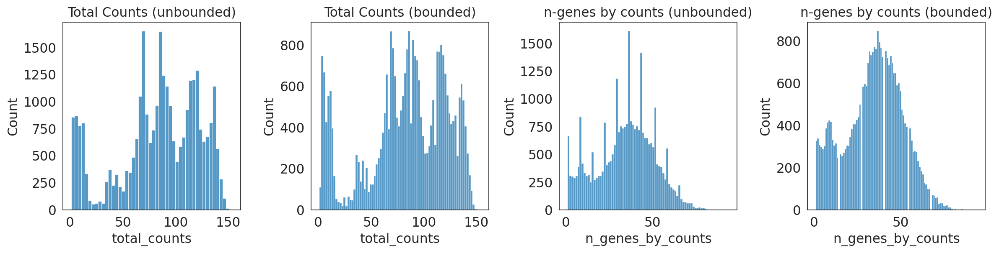

In [58]:
from banksy_utils.plot_utils import plot_qc_hist, plot_cell_positions

# bin options for fomratting histograms
# Here, we set 'auto' for 1st figure, 80 bins for 2nd figure. and so on
hist_bin_options = ['auto', 80, 80, 100]

plot_qc_hist(adata, 
         total_counts_cutoff = 300, # for visualization
         n_genes_high_cutoff = 1000, # for visualization
         n_genes_low_cutoff = 0, # for visualization
         bin_options = hist_bin_options)

## Filter 1 - minimum number of transcripts filter

In [59]:
adata.X.shape[0]
# 30,203 cells in total

30203

### Plot knee plot (log10 transcripts per cell)

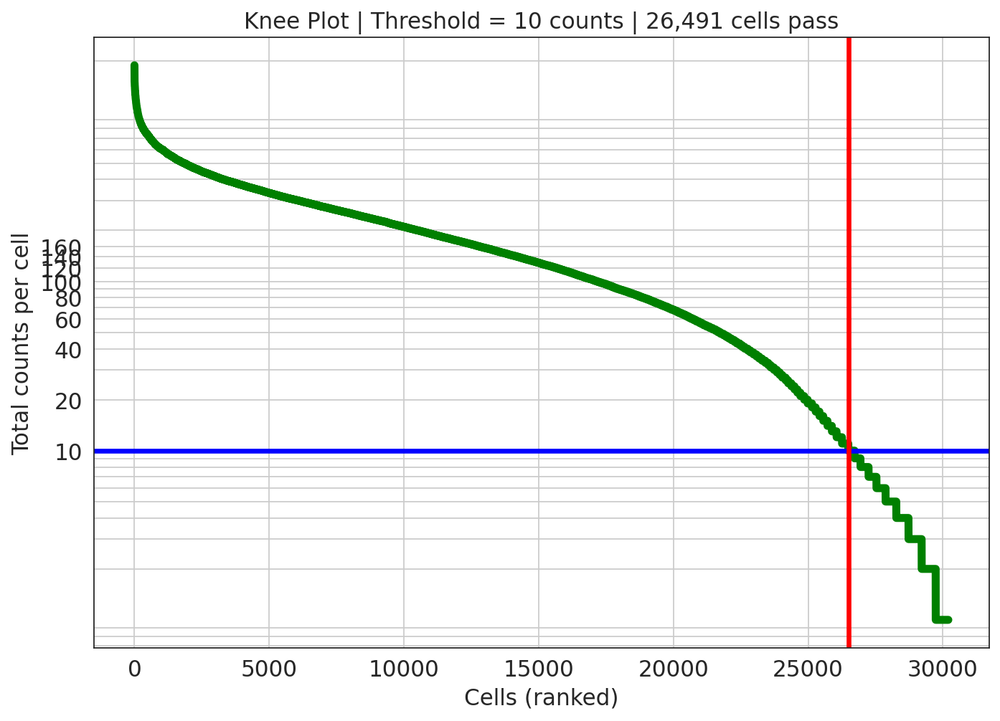

Cells passing threshold of 10 counts: 26,491 / 30,203 (87.7%)


In [62]:
## from https://pachterlab.github.io/kallistobustools/tutorials/kb_getting_started/python/kb_intro_2_python/

threshold = 10
#knee = np.sort((np.array(adata.X.sum(axis=1))).flatten())[::-1]
knee = np.sort(adata.obs['nCount_Xenium'].values)[::-1]
#knee = np.sort(np.asarray(adata.X.sum(axis=1)).flatten())[::-1]

cell_set = np.arange(len(knee))
#num_cells = cell_set[knee > threshold] [::-1][0]
num_cells = (knee > threshold).sum()

fig, ax = plt.subplots(figsize=(10, 7))

#ax.loglog(cell_set, knee, linewidth=5, color="g")
ax.semilogy(knee, linewidth =5, color="g")
#ax.loglog(cell_set, knee, linewidth=5, color="g")
ax.axhline(y=threshold, linewidth=3, color="b")
ax.axvline(x=num_cells, linewidth=3, color="r")

ax.set_xlabel("Cells (ranked)")
ax.set_ylabel("Total counts per cell")

ax.set_yticks([10, 20, 40, 60, 80, 100, 120, 140, 160])
ax.yaxis.set_major_formatter(mpl.ticker.ScalarFormatter())

plt.grid(True, which="both")
plt.title(f"Knee Plot | Threshold = {threshold} counts | {num_cells:,} cells pass")
plt.savefig(os.path.join(qc_path, f"transcript_knee_plot_{dataset_name}.png"), dpi =300, bbox_inches='tight')
plt.show()

print(f"Cells passing threshold of {threshold} counts: {num_cells:,} / {len(knee):,} ({num_cells/len(knee)*100:.1f}%)")

In [15]:
# Check if X looks normalised
print(adata.X.sum(axis=1).max())   # if all the same value, it's been normalised
print(adata.X.max())               # if small values like 5-10, likely log transformed

# Check processing history
print(adata.uns)  # may contain processing notes

154.0
74.0
OrderedDict()


In [16]:
qc_path


'data/xenium/output/GR_lung_non_res_roi/QC'

In [17]:
print(knee.min(), knee.max())

1.0 1892.0


In [18]:
print(type(adata.X.sum(axis=1)))
print(adata.X.sum(axis=1)[:5])

<class 'numpy.matrix'>
[[87.]
 [87.]
 [29.]
 [36.]
 [34.]]


#### Apply the mask to cell with the threshold = 10 

In [19]:
adata.obs

,nucleus_area,nCount_Xenium,nFeature_Xenium,segmentation_method,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,...,nFeature_SCT,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_10_genes,pct_counts_in_top_20_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt
akljhmnp-1,16.346563,134.0,43,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,43,43,3.784190,87.0,4.477337,51.724138,73.563218,0.0,0.0,0.0
akljiabi-1,40.550314,103.0,39,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,39,39,3.688879,87.0,4.477337,55.172414,78.160920,0.0,0.0,0.0
aklkomhk-1,NaN,1.0,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,17,17,2.890372,29.0,3.401197,75.862069,100.000000,0.0,0.0,0.0
akllenhp-1,NaN,8.0,6,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,10,10,2.397895,36.0,3.610918,100.000000,100.000000,0.0,0.0,0.0
aklobaoh-1,NaN,3.0,3,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,16,16,2.833213,34.0,3.555348,82.352941,100.000000,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ojdcldep-1,15.353126,43.0,25,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,9,9,2.302585,9.0,2.302585,100.000000,100.000000,0.0,0.0,0.0
ojdcmfnn-1,18.694688,7.0,5,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,5,5,1.791759,7.0,2.079442,100.000000,100.000000,0.0,0.0,0.0
ojdddlfk-1,10.837500,9.0,9,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,9,9,2.302585,9.0,2.302585,100.000000,100.000000,0.0,0.0,0.0
ojddgmnh-1,31.157814,10.0,10,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,10,10,2.397895,10.0,2.397895,100.000000,100.000000,0.0,0.0,0.0


In [20]:
## Apply a mask to retrieve cells that don't pass the filter
mask = adata.obs['nCount_Xenium'] <= threshold

# Turn the masked cells into a data frame
mask.to_frame()
mask_cells = mask.reset_index()
mask_cells = mask_cells.rename(columns={"index":"cell_id", "nCount_Xenium" : "threshold_passed"})

# Filter for the poor cells and keep these ids for future plotting
poor_cells = mask_cells[mask_cells['threshold_passed']]

# Put results for the cells passing the threshold into the object directly
adata.obs['threshold_passed'] = adata.obs['nCount_Xenium'] > threshold #True = passed


In [21]:
adata.obs['threshold_passed']

akljhmnp-1     True
akljiabi-1     True
aklkomhk-1    False
akllenhp-1    False
aklobaoh-1    False
              ...  
ojdcldep-1     True
ojdcmfnn-1    False
ojdddlfk-1    False
ojddgmnh-1    False
ojddpahj-1     True
Name: threshold_passed, Length: 30203, dtype: bool

#### Plot location of poor cells on tissue

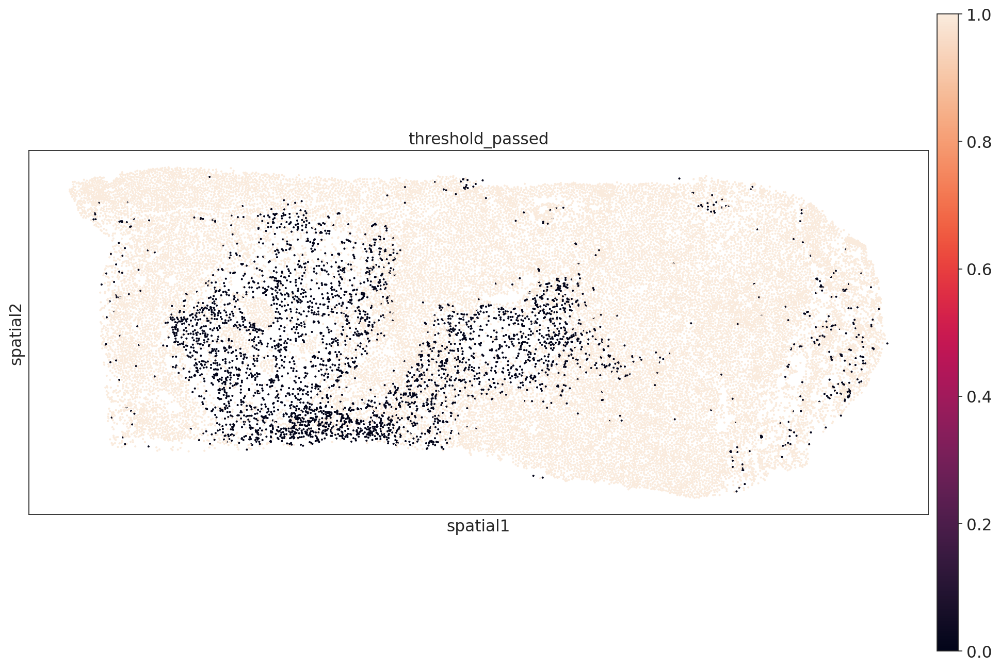

In [22]:
import squidpy as sq
with rc_context({"figure.figsize": (12,8)}):
    sq.pl.spatial_scatter(
        adata,
        library_id="spatial",
        color="threshold_passed",
        shape=None,
        size=2,
        img=False
    )


plt.savefig(
    os.path.join(qc_path, f"tissue_spatial_scatter_threshold_passed_cells_qc_{dataset_name}.png"),
    dpi=300,
    bbox_inches='tight'
    )


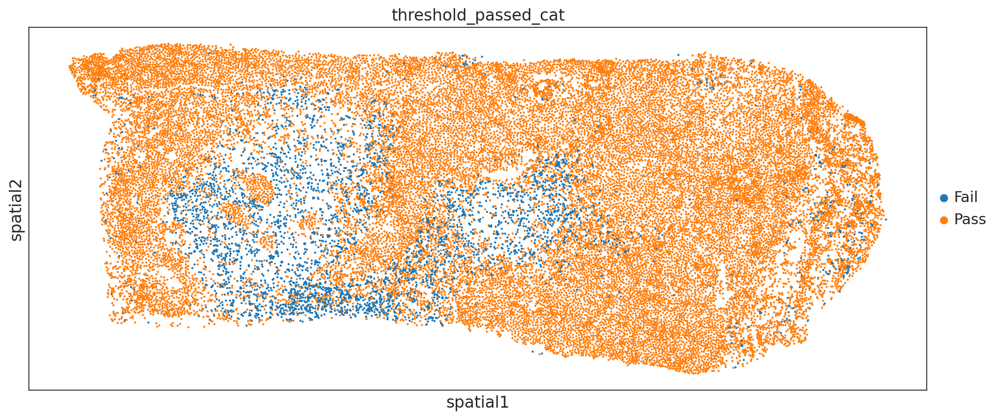

In [23]:
adata.obs["threshold_passed_cat"] = adata.obs["threshold_passed"].map({True: "Pass", False: "Fail"}).astype("category")

with rc_context({"figure.figsize": (12, 8)}):
    sq.pl.spatial_scatter(
        adata,
        library_id="spatial",
        color="threshold_passed_cat",
        shape=None,
        size=2,
        img=False
    )

## Do an initial filter of cells by their cell counts, MT count and gene counts
### We can then first filter cells by their counts, MT and gene filters.
**NOTE:** I have decided not to filter on the basis of gene counts as I don't have a sense of what is a biologically significant minimum counts per gene.

In [24]:
#from banksy_utils.filter_utils import filter_cells

# Filter cells with each respective filters
# adata = filter_cells(adata, 
#              min_count=10, 
#              max_count=1000, 
#              MT_filter=20, 
#              gene_filter=10)

### Plot the Histograms of the filtered dataset

In [25]:
# hist_bin_options = ['auto', 100, 60, 100]

# plot_qc_hist(adata,
#         total_counts_cutoff=2000,
#         n_genes_high_cutoff=2000, 
#         n_genes_low_cutoff= 0,
#         bin_options = hist_bin_options)

### Visualize the position of cells using a scatter plot


{'fig_size': (6, 6), 's': 0.2, 'c1': 'red', 'c2': 'slateblue', 'label1': 'Original cells', 'label2': 'Remaining cells', 'add_circle': False, 'puck_center': (3330, 3180), 'puck_radius': 2550}


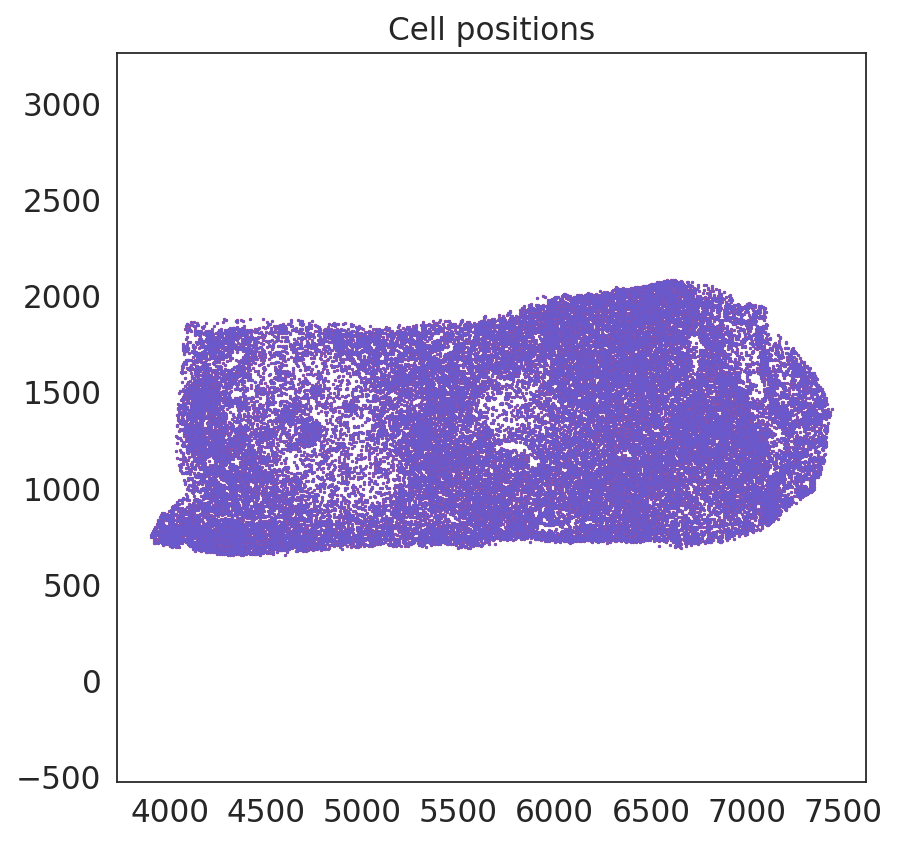

In [26]:
# Visualize cell positions in puck
plot_cell_positions(adata,
            raw_x,
            raw_y,
            coord_keys=coord_keys,
            fig_size = (6,6))

## Normalize and log transform data

Normalize data matrix using `normalize_total`.


In [27]:
## Save the raw counts
adata.layers["counts"] = adata.X.copy()

## Inspect the counts
print(adata.layers["counts"][:5,:5])

  (1, 3)	1.0
  (0, 4)	3.0


In [28]:
from banksy_utils.filter_utils import normalize_total, filter_hvg, print_max_min

## Normalizes the anndata dataset
normalize_total(adata)
print(adata.X)


--- Max-Min before normalization -----
Displaying max and min of Dataset
Max: 74.0, Min: 0.0

--- Max-Min after normalization -----
Displaying max and min of Dataset
Max: 88.0, Min: 0.0

  (2635, 0)	1.0731707317073171
  (5509, 0)	12.13793103448276
  (12745, 0)	0.7586206896551725
  (13214, 0)	2.3466666666666667
  (13564, 0)	0.8073394495412844
  (14380, 0)	0.6518518518518518
  (15283, 0)	1.4789915966386555
  (16683, 0)	1.660377358490566
  (20389, 0)	4.888888888888888
  (20565, 0)	1.9555555555555555
  (20596, 0)	8.0
  (21915, 0)	1.0
  (23529, 0)	1.1891891891891893
  (29670, 0)	7.333333333333334
  (30201, 0)	8.8
  (6, 1)	1.0476190476190477
  (10, 1)	1.375
  (28, 1)	2.120481927710843
  (52, 1)	1.375
  (53, 1)	1.1139240506329113
  (89, 1)	1.0232558139534884
  (94, 1)	1.2054794520547945
  (97, 1)	1.0232558139534884
  (99, 1)	1.0476190476190477
  (172, 1)	1.0
  :	:
  (26246, 303)	1.0476190476190477
  (26279, 303)	16.210526315789473
  (26289, 303)	0.9670329670329669
  (26341, 303)	0.96703296703

In [29]:
## Perform log-transformation and save the log-normalised in adata.raw
sc.pp.log1p(adata)
print(adata.X)

adata.raw = adata.copy()


  (2635, 0)	0.7290791897860086
  (5509, 0)	2.575503545140227
  (12745, 0)	0.5645298027378518
  (13214, 0)	1.2079648255954734
  (13564, 0)	0.5918558465088448
  (14380, 0)	0.5018969930216892
  (15283, 0)	0.9078518632282904
  (16683, 0)	0.9784679768260464
  (20389, 0)	1.7730673362159024
  (20565, 0)	1.083686638451434
  (20596, 0)	2.197224577336219
  (21915, 0)	0.6931471805599453
  (23529, 0)	0.7835312420282143
  (29670, 0)	2.120263536200091
  (30201, 0)	2.2823823856765264
  (6, 1)	0.7166776779701394
  (10, 1)	0.8649974374866045
  (28, 1)	1.1379874539029398
  (52, 1)	0.8649974374866045
  (53, 1)	0.7485459599497336
  (89, 1)	0.7047080029610213
  (94, 1)	0.7909449238360718
  (97, 1)	0.7047080029610213
  (99, 1)	0.7166776779701394
  (172, 1)	0.6931471805599453
  :	:
  (26246, 303)	0.7166776779701394
  (26279, 303)	2.8455211917308127
  (26289, 303)	0.6765262993239048
  (26341, 303)	0.6765262993239048
  (26349, 303)	0.6875133628416892
  (26478, 303)	0.7762620872704519
  (26700, 303)	2.923161580

## Generate spatial weights graph

#### In BANKSY, we imagine edges / connections in the graph to represent neighbour relationships between cells

In doing so, the banksy algorithm requires the following specifications in the main BANKSY algorithm:

1. The number of spatial neighbours `num_neighbours`, this is also known as the $k_{geom}$ parameter in the manuscript.
    
2. Assigning weights (dependent on inter-cell spatial distances) to edges in the connected spatial graph. By default, we use the `gaussian decay` option, where weights decay as a function of distnace to the index cell with $\sigma$ = `sigma`. As default, we set $\sigma$ to be the median distance between cells, and do not prescribe any cutoff-radius `p_outside` (no cutoff is conducted).

3. The Azumithal Gabor Filter parameter `max_m` which indicates whether to use the AGF (`max_m = 1`) or just the mean expression (`max_m = 0`). By default, we set `max_m = 1`.
    
    
### Construction of the spatial $k_{geom}$ Nearest-Neighbour graph

We represent connections between cells and its neighbours in a graph $G = \{N,E,W\}$, comprising of a set of nodes $n \in N$. edges representing connectivity between cells $e \in E$, the edges are be weighted $w \in W$ as a function of the spatial distance between cells.
    
Weight of edges can be represented by uniform distance (i.e., a closer neighbour will have a higher weight), or using `reciprocal` ($\frac{1}{r})$. As mentioned above, BANKSY by default applies a gaussian envelope function to map the distance (between nodes) to the `weights` the connection of cell-to-neighbor

In [30]:
from banksy.main import median_dist_to_nearest_neighbour

# set params
# ==========
plot_graph_weights = True
k_geom = 15 # only for fixed type
max_m = 1 # azumithal transform up to kth order
nbr_weight_decay = "scaled_gaussian" # can also be "reciprocal", "uniform" or "ranked"

# Find median distance to closest neighbours, the median distance will be `sigma`
nbrs = median_dist_to_nearest_neighbour(adata, key = coord_keys[2])


Median distance to closest cell = 7.7617552249571675

---- Ran median_dist_to_nearest_neighbour in 0.04 s ----



### Generate spatial weights from distance

Here, we generate the spatial weights using the gaussian decay function from the median distance to the k-th nearest neighbours as specified earlier.

The utility functions `plot_edge_histograms`, `plot_weights`, `plot_theta_graph` can be used to visualize the characteristics of the edges, weights and theta (from the AGF) respectively.

### Optional Visualization of Weights and edge graphs

(1) **Visualize the edge histogram** to show the histogram of distances between cells and the weights between cells by setting `plt_edge_hist = True`

(2) **Visualize weights** by plotting the connections. Line thickness is proportional to edge weight (normalized by highest weight across all edges) by setting `plt_weights = True`

(3) **Visualize weights with Azimuthal angles**. Visualizing the azimuthal angles computed by the AGF by colour, the azimuthal connectivities are annotated in red. Warning: this plot many take a few minutes to compute for large datasets. By default, `plt_agf_angles = False`

(4) **Visualize angles around random cell**. Plot points around a random index cell, annotated with angles from the index cell. `plot_theta = True`

In [31]:
from banksy.initialize_banksy import initialize_banksy

banksy_dict = initialize_banksy(
    adata,
    coord_keys,
    k_geom,
    nbr_weight_decay=nbr_weight_decay,
    max_m=max_m,
    plt_edge_hist=False,
    plt_nbr_weights=False,
    plt_agf_angles=False, # takes long time to plot
    plt_theta=False,
)


Median distance to closest cell = 7.7617552249571675

---- Ran median_dist_to_nearest_neighbour in 0.05 s ----

---- Ran generate_spatial_distance_graph in 0.09 s ----

---- Ran row_normalize in 0.05 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.43 s ----

---- Ran generate_spatial_distance_graph in 0.14 s ----

---- Ran theta_from_spatial_graph in 0.12 s ----

---- Ran row_normalize in 0.05 s ----

---- Ran generate_spatial_weights_fixed_nbrs in 0.61 s ----



## Generate BANKSY matrix

To generate the BANKSY matrix, we proceed with the following:

1. Matrix multiply sparse CSR weights matrix with cell-gene matrix to get **neighbour matrix** and the **AGF matrix** if `max_m` > 1
2. Z-score both matrices along **genes**
3. Multiply each matrix by a weighting factor $\lambda$ (We refer to this parameter as `lambda` in our manuscript and code)
4. Concatenate the matrices along the genes dimension in the form -> `horizontal_concat(cell_mat, nbr_mat, agf_mat)`

Here, we save all the results in the dictionary (`banksy_dict`), which contains the results from the subsequent operations for BANKSY. 

In [32]:
## Parameter labels for f-string labelling
# res_label = "0.50"
# lambda_label = "0.20" #set to one of the lambda values for now, this can be switched

In [33]:
from banksy.embed_banksy import generate_banksy_matrix

# # The following are the main hyperparameters for BANKSY
# resolutions = [0.5] # clustering resolution for UMAP
# lambda_list = [0.2] # list of lambda parameters

banksy_dict, banksy_matrix = generate_banksy_matrix(adata, banksy_dict, lambda_list, max_m)

Runtime Mar-20-2026-14-32

304 genes to be analysed:
Gene List:
Index(['ACER1', 'ACTA2', 'ADAM12', 'AHNAK2', 'AIF1', 'AKR1C1', 'ALOX5AP',
       'APCDD1', 'APOD', 'AQP1',
       ...
       'TYR', 'TYROBP', 'TYRP1', 'UBE2C', 'VCAM1', 'VEGFA', 'VIM', 'VWF',
       'WDFY4', 'ZNF667-AS1'],
      dtype='object', length=304)

Check if X contains only finite (non-NAN) values
Decay Type: scaled_gaussian
Weights Object: {'weights': {0: <30203x30203 sparse matrix of type '<class 'numpy.float64'>'
	with 453045 stored elements in Compressed Sparse Row format>, 1: <30203x30203 sparse matrix of type '<class 'numpy.complex128'>'
	with 906090 stored elements in Compressed Sparse Row format>}}

Nbr matrix | Mean: 0.12 | Std: 0.27
Size of Nbr | Shape: (30203, 304)
Top 3 entries of Nbr Mat:

[[0.         0.         0.05559758]
 [0.         0.         0.        ]
 [0.         0.         0.04369879]]

AGF matrix | Mean: 0.04 | Std: 0.06
Size of AGF mat (m = 1) | Shape: (30203, 304)
Top entries of AGF:
[[0.

In [34]:
dict_matrix=banksy_dict["scaled_gaussian"][0.2]['adata'].obs.keys()
print(dict_matrix)
#dict_matrix.to_csv(f"data/xenium/processed/{dataset_name}_dict_matrix.csv")

Index(['nucleus_area', 'nCount_Xenium', 'nFeature_Xenium',
       'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword',
       'nCount_ControlCodeword', 'nFeature_ControlCodeword',
       'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area',
       'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts',
       'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes',
       'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'threshold_passed', 'threshold_passed_cat'],
      dtype='object')


### Append Non-spatial results to the `banksy_dict` for comparsion

In [35]:
from banksy.main import concatenate_all

banksy_dict["nonspatial"] = {
    # Here we simply append the nonspatial matrix (adata.X) to obtain the nonspatial clustering results
    0.0: {"adata": concatenate_all([adata.X], 0, adata=adata), }
}

print(banksy_dict['nonspatial'][0.0]['adata'])

Scale factors squared: [1.]
Scale factors: [1.]
AnnData object with n_obs × n_vars = 30203 × 304
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'threshold_passed', 'threshold_passed_cat'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'


## Determine number of PCs to input into UMAP
The noise_equiv_singular_value() function helps to determine the number of principal components to use for UMAP.


In [36]:
output_path

'data/xenium/output/GR_lung_non_res_roi/'

In [37]:

#adata.var_names # feature names
#adata.obs_names # cell ids

## Import the noise_equiv_singular_value() function 
from banksy_utils.pca import plot_singular_values
import numpy as np

# X is a matrix of cells vs gene names
# Store the cells vs genes (features) as a matrix for PCA
X = adata.X.toarray()

# Transpose the matirx so that the columns are the genes (features) not the cell IDs
X = X.T
X.shape

# Calculate the higher singular value 
from banksy_utils.pca import noise_equiv_singular_value

noise_sv, all_permuted_svs = noise_equiv_singular_value(
    data = X,
    num_permutations = 50,
    #average_type = "mean",
    verbose = True
    )
print(f"Noise threshold (mean top singular value of permuted data): {noise_sv:.4f}")

List of all permuted top singular values:
[71.49343541 71.94789058 71.66770286 71.3747998  71.21408375 71.33072343 71.35888494 71.72668297 71.67541734 71.46091717 71.36151828 71.32105654 71.35792261
 71.32514401 71.29039228 71.57955174 71.23475121 71.47242881 71.56723047 71.28491118 71.62283091 71.32971582 71.34490887 71.38462497 71.29739987 71.25105963
 71.48661391 71.31902974 71.56491204 71.34031148 71.29385744 71.54359738 71.37842792 71.83832022 71.4150314  71.11420758 71.19364148 71.36579738 71.23536097
 71.37786731 71.43072653 71.54242597 71.41099266 71.41340674 71.52996168 71.27018853 71.44037946 71.42302866 71.68741409 71.37103039]

---- Ran noise_equiv_singular_value in 15.35 s ----

Noise threshold (mean top singular value of permuted data): 71.4253


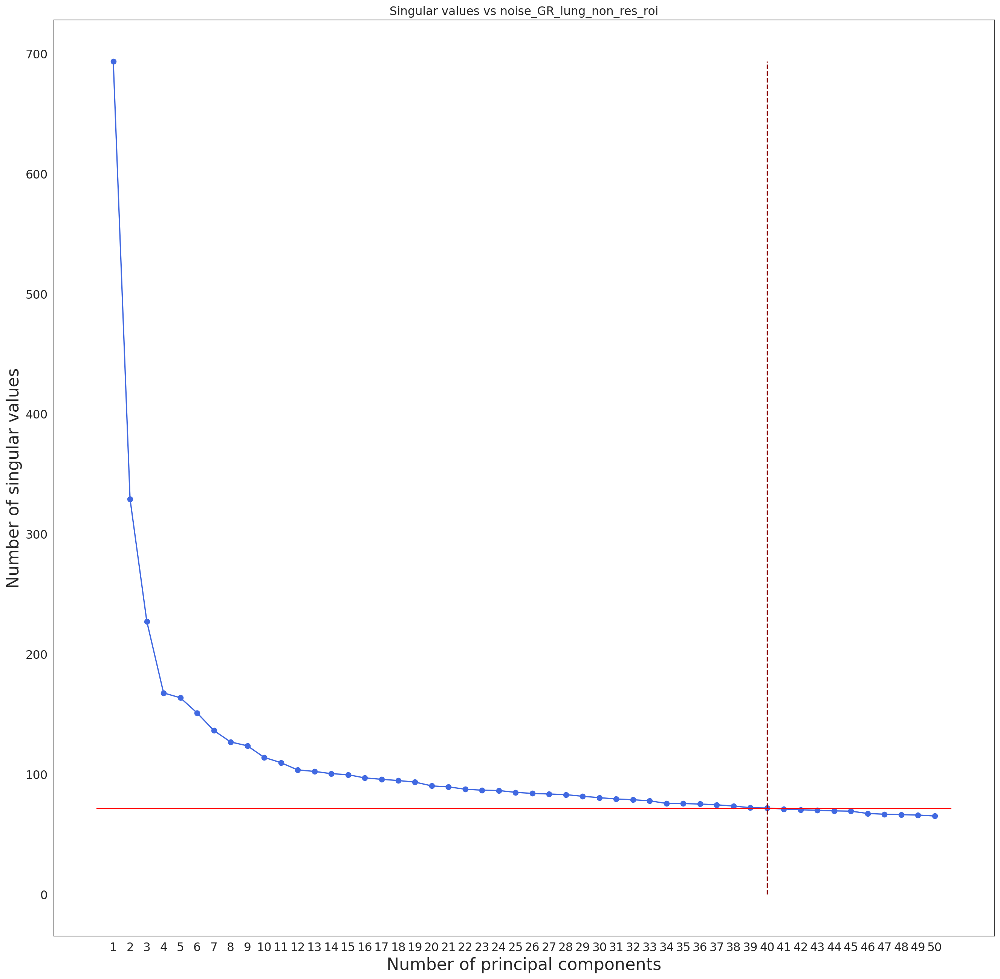

In [38]:
## Perform PCA 
from sklearn.decomposition import PCA

pca = PCA(n_components=50).fit(X)


## Plot singular values vs noise to determine the optimal number of PC above the noise threshold
from banksy_utils.pca import plot_singular_values

plot_singular_values(
    pca, 
    noise_highest_sv=noise_sv, 
    title=f"Singular values vs noise_{dataset_name}",
    figsize=(20,20),
    #save_path = f"{output_path}singular_values_vs_noise_{dataset_name}"
    )

plt.xlabel("Number of principal components", fontsize=20)
plt.ylabel("Number of singular values", fontsize=20)

plt.savefig(
    os.path.join(qc_path, f"singular_values_vs_noise_{dataset_name}.png"),
    dpi=300,
    bbox_inches='tight'
    )

In [39]:
# from banksy_utils.pca import plot_remaining_variance
# plot_remaining_variance(pca, figsize=(15,15))

## Reduce dimensions of each data matrix
We utilize two common methods for dimensionality reduction:

1. PCA (using `scikit-learn`), we reduce the size of the matrix from $3*N_{genes}$ to `pca_dims`. As a default settings, we reduce to 20 dimensions.
2. UMAP (`UMAP` package), which we use to visualize expressions of clusters in the umap space (2-D space).

Current decay types: ['scaled_gaussian', 'nonspatial']

Reducing dims of dataset in (Index = scaled_gaussian, lambda = 0.2)

Setting the total number of PC = 35
Original shape of matrix: (30203, 912)
Reduced shape of matrix: (30203, 35)
------------------------------------------------------------
min_value = -23.650970305457914, mean = 9.384954090442126e-16, max = 38.219080924176346

Conducting UMAP and adding embeddings to adata.obsm["reduced_pc_35_umap"]
UMAP embedding
------------------------------------------------------------
shape: (30203, 2)


AxisArrays with keys: reduced_pc_35, reduced_pc_35_umap

Reducing dims of dataset in (Index = nonspatial, lambda = 0.0)

Setting the total number of PC = 35
Original shape of matrix: (30203, 304)
Reduced shape of matrix: (30203, 35)
------------------------------------------------------------
min_value = -26.285172966796086, mean = -2.0877261362597577e-17, max = 38.10573848475159

Conducting UMAP and adding embeddings to adata.obsm["reduce

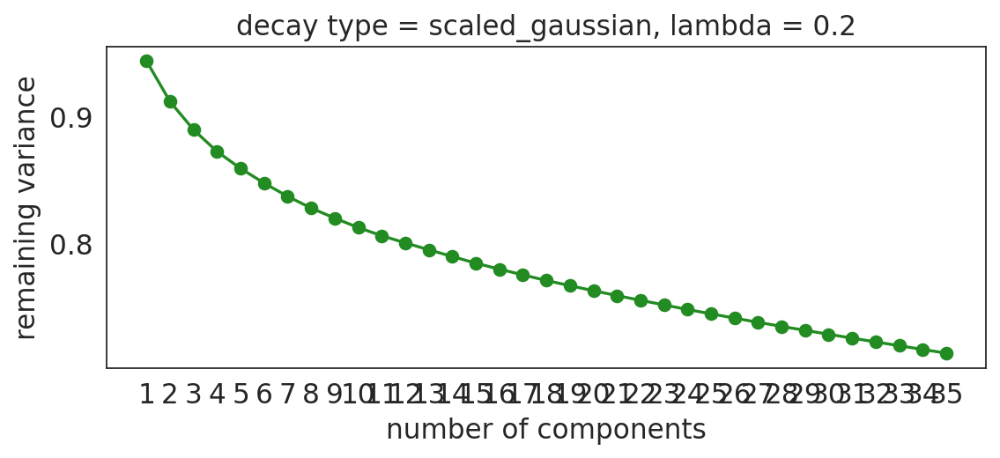

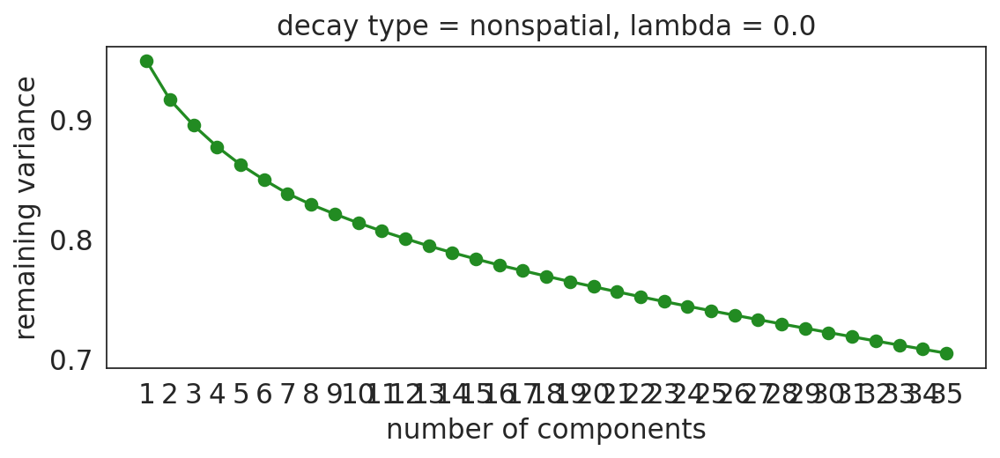

In [40]:
from banksy_utils.umap_pca import pca_umap

pca_umap(banksy_dict,
         pca_dims = pca_dims,
         add_umap = True,
         #plt_remaining_var = True,
         )

#pca label for downstream f-string labels
pca_label = "35"

### Cluster cells using a partition algorithm

For the purpose of this dataset, we cluster cells using the `leiden` algorithm (use `!pip install leidenalg` if package missing) partition methods. Other clustering algorithms include `louvain` (another resolution based clustering algorithm), or `mclust` (a clustering based on gaussian mixture model). 

Note that by default, we recommend resolution-based clustering (i.e., `leiden` or `louvain`) if no prior information on the number of clusters known. However, if the number of clusters is known *a priori*, the user can use `mclust` (gaussian-mixture model) by specifying the number of clusters beforehand.

In [41]:
from banksy.cluster_methods import run_Leiden_partition_parallel

## Parallelised leiden partitioning function for clustering, if a computer has n cores, set max_workers to n-1
results_df, max_num_labels = run_Leiden_partition_parallel(
    banksy_dict,
    resolutions,
    num_nn=50,
    max_workers=7 # 8-core laptop
)

reduced_pc_35 

reduced_pc_35_umap 

reduced_pc_35 

reduced_pc_35_umap 


Nearest-neighbour weighted graph (dtype: float64, shape: (30203, 30203)) has 1510150 nonzero entries.
---- Ran find_nn in 42.16 s ----


Nearest-neighbour connectivity graph (dtype: int16, shape: (30203, 30203)) has 1510150 nonzero entries.

(after computing shared NN)
Allowing nearest neighbours only reduced the number of shared NN from 34323863 to 1494975.


Shared nearest-neighbour (connections only) graph (dtype: int16, shape: (30203, 30203)) has 1323118 nonzero entries.

Shared nearest-neighbour (number of shared neighbours as weights) graph (dtype: int16, shape: (30203, 30203)) has 1323118 nonzero entries.

sNN graph data:
[32 34 32 ... 41 21 28]

---- Ran shared_nn in 1.23 s ----


-- Multiplying sNN connectivity by weights --


shared NN with distance-based weights graph (dtype: float64, shape: (30203, 30203)) has 1323118 nonzero entries.
shared NN weighted graph data: [0.15247374 0.152566   0.1527864  .

,param_str,decay,lambda_param,num_pcs,resolution,num_labels,labels,adata,relabeled
nonspatial_pc35_nc0.00_r0.50,nonspatial_pc35_nc0.00_r0.50,nonspatial,0.0,35,0.5,12,"Label object:\nNumber of labels: 12, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 12, number of..."
scaled_gaussian_pc35_nc0.20_r0.50,scaled_gaussian_pc35_nc0.20_r0.50,scaled_gaussian,0.2,35,0.5,10,"Label object:\nNumber of labels: 10, number of...",[[[View of AnnData object with n_obs × n_vars ...,"Label object:\nNumber of labels: 10, number of..."


## Plot results

### Visualize the clustering results from BANKSY, including the clusters from the Umap embbedings

Saving figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_nonspatial_pc35_nc0.00_r0.50_spatialmap.png
number of labels: 12
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 12
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 12
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((12, 30203) x (30203, 30203) x (30203, 12))

Saving full-figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_nonspatial_pc35_nc0.00_r0.50_full_figure.png
Saving figure at data/xenium/output/GR_lung_non_res_roi/GR_lung_non_res_roi_scaled_gaussian_pc35_nc0.20_r0.50_spatialmap.png
number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

number of labels: 10
---- Ran plot_2d_embeddings in 0.00 s ----

---- Ran row_normalize in 0.00 s ----


matrix multiplying labels x weights x labels-transpose ((1

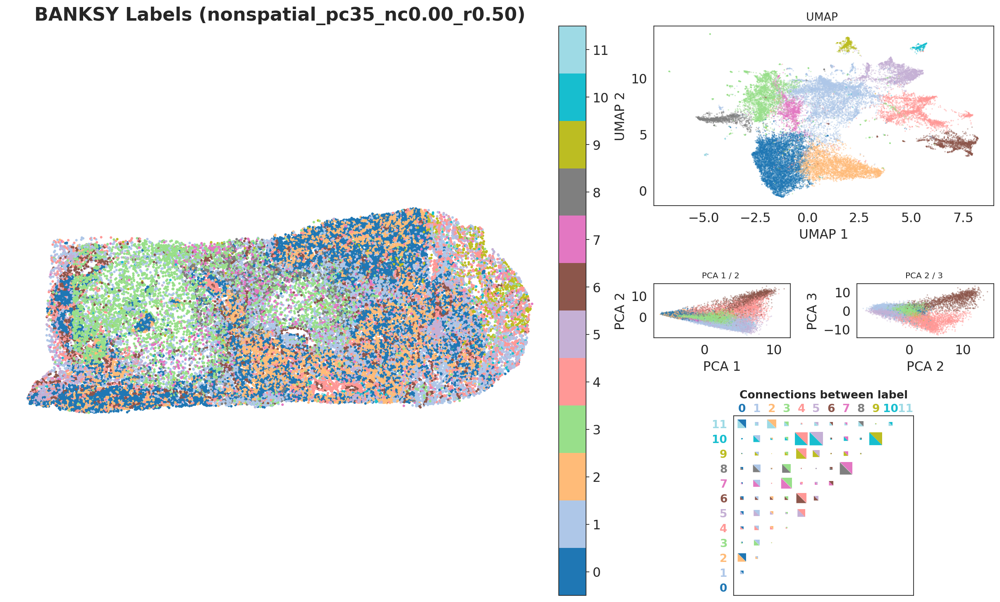

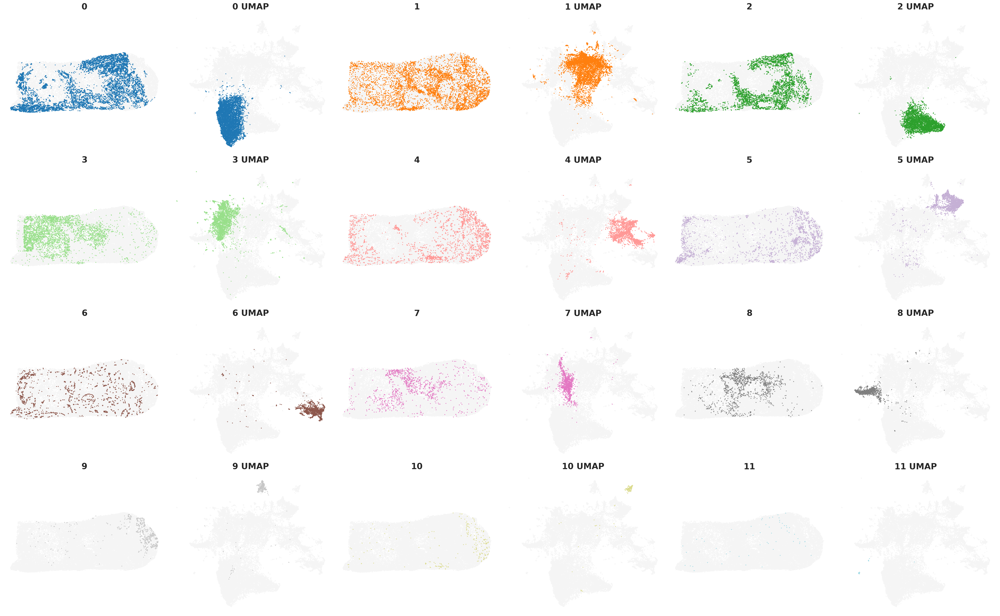

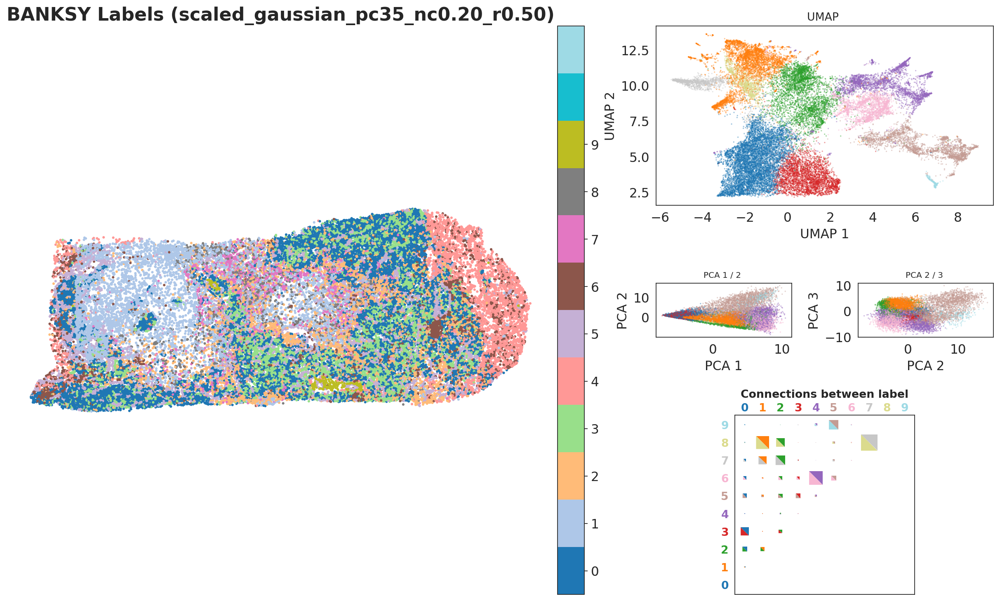

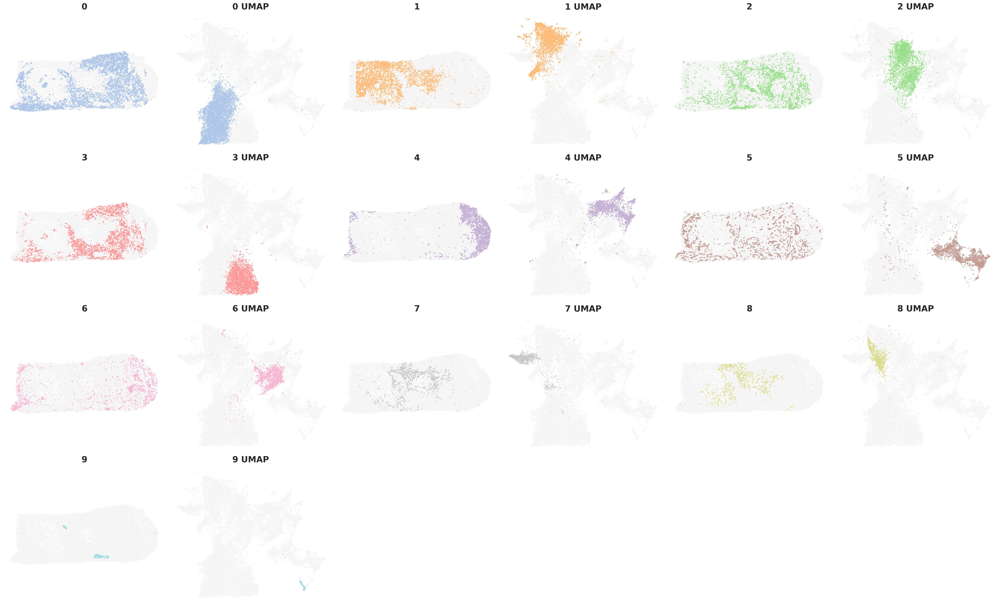

In [42]:
from banksy.plot_banksy import plot_results

c_map =  'tab20' # specify color map
weights_graph =  banksy_dict[f"{nbr_weight_decay}"]['weights'][0]

plot_results(
    results_df,
    weights_graph,
    c_map,
    match_labels = False,
    coord_keys = coord_keys,
    max_num_labels  =  max_num_labels, 
    #save_path = os.path.join(file_path, 'tmp_png'),
    save_fig = True, # save the spatial map of all clusters
    save_seperate_fig = True, # save the figure of all clusters plotted seperately
    dataset_name = f"{dataset_name}",
    save_fullfig=True,
    save_path = output_path
)

### Cell type annotation - lambda = 0.2

In [43]:
from banksy_utils.cluster_utils import pad_clusters, create_spatial_nonspatial_adata,  refine_cell_types

# Here we manually assign clusters to their identity using a dictionary, using just numbers as placeholders prior to manual annotation
cluster2annotation_spatial = {
    "0" : "0",
    "1" : "1",
    "2" : "2",
    "3" : "3",
    "4" : "4",
    "5" : "5",
    "6" : "6",
    "7" : "7",
    "8" : "8",
    "9" : "9"
}

pad_clusters(cluster2annotation_spatial, list(range(max_num_labels)))

cluster2annotation_nonspatial = {
    "0" : "0",
    "1" : "1",
    "2" : "2",
    "3" : "3",
    "4" : "4",
    "5" : "5",
    "6" : "6",
    "7" : "7",
    "8" : "8",
    "9" : "9",
    "10" : "10"
}

In [44]:
## Save annotations in two different anndata objects (adata_spatial and adata_nonspatial)

adata_spatial, adata_nonspatial = create_spatial_nonspatial_adata(results_df,
                                    pca_dims,
                                    lambda_list, 
                                    resolutions,
                                    cluster2annotation_spatial,
                                    cluster2annotation_nonspatial)

Using spatial params: scaled_gaussian_pc35_nc0.20_r0.50
nonspatial_pc35_nc0.00_r0.50


In [45]:
# Option 2 - manually transfer the layer from the original object
adata_spatial.layers['counts'] = adata.layers['counts'][adata.obs.index.isin(adata_spatial.obs.index)]

ValueError: Value passed for key 'counts' is of incorrect shape. Values of layers must match dimensions (0, 1) of parent. Value had shape (30203, 304) while it should have had (30203, 912).

In [46]:
print(adata.shape)          # (n_cells, 304)
print(adata_spatial.shape)  # (n_cells, 912)

# Check if the genes overlap
common_genes = adata.var.index.intersection(adata_spatial.var.index)
print(f"Common genes: {len(common_genes)}")

# Check what the extra genes are
print(adata_spatial.var.index[:20])


(30203, 304)
(30203, 912)
Common genes: 304
Index(['ACER1', 'ACTA2', 'ADAM12', 'AHNAK2', 'AIF1', 'AKR1C1', 'ALOX5AP',
       'APCDD1', 'APOD', 'AQP1', 'AQP3', 'AREG', 'ARHGDIB', 'ASPN', 'ATF3',
       'AXL', 'BASP1', 'BCAN', 'BHLHE41', 'BIRC3'],
      dtype='object')


In [45]:
## Store the cluster labels as a string in .obs
banksy_dict[f"{nbr_weight_decay}"][0.2]['adata'] #lambda = 0.20
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"]= adata_spatial.obs[f"labels_scaled_gaussian_pc{pca_label}_nc{lambda_label}_r{res_label}"].astype(str)

In [46]:
## Pull out genes as data frame
genes = adata.var_names
gene_df = pd.DataFrame(adata.X.toarray(), columns=genes, index=adata.obs_names)
#print(gene_df)

gene_count_across_cells = gene_df.sum(axis=0)
gene_count_across_cells.to_frame()
gene_count_across_cells.columns = ["gene", "counts"]

print(gene_count_across_cells)
gene_count_across_cells.to_csv(f"{processed_path}{dataset_name}_gene_count_across_cells_not_SCTransformed.csv")
type(gene_count_across_cells)

ACER1            18.990453
ACTA2          2465.077307
ADAM12         3773.125327
AHNAK2         3098.900906
AIF1           9408.489459
                  ...     
VEGFA          7310.597884
VIM           48515.573646
VWF            1975.815696
WDFY4          1925.037794
ZNF667-AS1      950.057820
Length: 304, dtype: float64


pandas.core.series.Series

In [47]:
print(adata_spatial.__repr__())

AnnData object with n_obs × n_vars = 30203 × 912
    obs: 'nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword', 'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area', 'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'threshold_passed', 'threshold_passed_cat', 'labels_scaled_gaussian_pc35_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc35_nc0.20_r0.50'
    var: 'names', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'is_nbr', 'k'
    obsm: 'reduced_pc_35', 'reduced_pc_35_umap', 'xy'


# Top expressed genes per cluster

### Spatial clustering results

In [48]:
import scanpy as sc

## Rank genes and identify cluster gene markers
sc.tl.rank_genes_groups(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
    method='wilcoxon',
    key_added=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers"
)


In [49]:
## Check which cluster keys exist
adata_spatial.uns[f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers']['names'].dtype

dtype((numpy.record, [('0', 'O'), ('1', 'O'), ('2', 'O'), ('3', 'O'), ('4', 'O'), ('5', 'O'), ('6', 'O'), ('7', 'O'), ('8', 'O'), ('9', 'O')]))

In [50]:
## Using the filter_ranked_genes_by_type to create a key for 
from banksy_utils.annotation_utils import filter_ranked_genes_by_type

key_filtered = filter_ranked_genes_by_type(
    adata_spatial,
    key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers",
    top_n=100,
    gene_type = "raw",
    new_key_suffix="_raw",
)

Copied cluster labels to adata.obs['banksy_cluster_pc35_nc0.20_r0.50_raw']
Stored filtered raw markers in adata.uns['banksy_cluster_pc35_nc0.20_r0.50_markers_raw']


In [133]:
key_filtered

'banksy_cluster_pc35_nc0.20_r0.50_markers_raw'

In [134]:
adata_spatial.uns[key_filtered]

{'params': {'groupby': 'banksy_cluster_pc35_nc0.20_r0.50',
  'reference': 'rest',
  'method': 'wilcoxon',
  'use_raw': False,
  'layer': None,
  'corr_method': 'benjamini-hochberg'},
 'names': rec.array([('TYR', 'FCER1G', 'CXCR4', 'CENPF', 'POSTN', 'IGFBP7', 'CCL5', 'ID2', 'TPD52L2', 'MYL9'),
            ('S100B', 'CD68', 'PKHD1L1', 'TYMS', 'COL6A1', 'SPARCL1', 'CD3E', 'MARCKSL1', 'CTSZ', 'ACTA2'),
            ('EDNRB', 'CD163', 'DSG1', 'STMN1', 'CXCL12', 'COL6A1', 'ARHGDIB', 'HES1', 'FBXO7', 'MYH11'),
            ('TFAP2A', 'TYROBP', 'HAPLN1', 'RRM2', 'COL6A3', 'PLVAP', 'ITGA4', 'ATF3', 'DST', 'TAGLN'),
            ('PLP1', 'AIF1', 'SERPINB2', 'MKI67', 'CD163', 'CDH5', 'LCK', 'FSCN1', 'ICAM1', 'IGFBP7'),
            ('MITF', 'ARHGDIB', 'HBD', 'TOP2A', 'LYZ', 'THY1', 'CD3G', 'ID1', 'ITGB1', 'SPARCL1'),
            ('MLANA', 'RNASE1', 'AREG', 'HMGN2', 'ARHGDIB', 'POSTN', 'CD3D', 'TUBB2B', 'LENG8', 'NOTCH3'),
            ('PRAME', 'CTSZ', 'FUT6', 'PTTG1', 'CD4', 'AQP1', 'CD8A', 'MYC', 'C

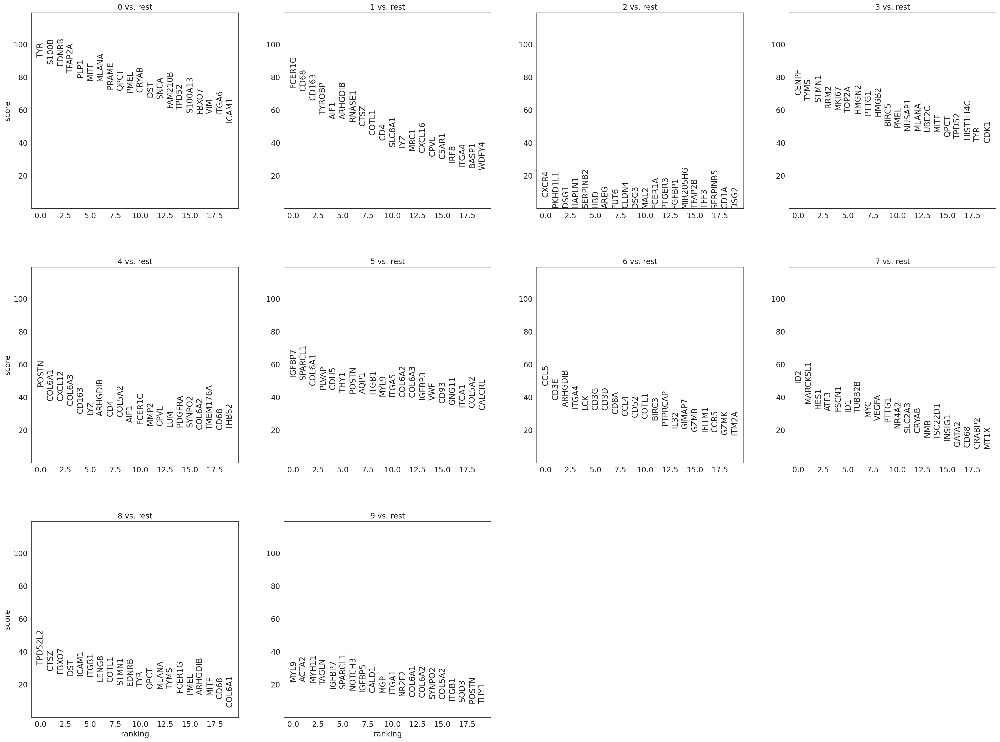

In [135]:
# Plot the gene markers for each cluster
sc.pl.rank_genes_groups(
    adata_spatial, 
    key=key_filtered,
    method='wilcoxon',
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_0", 
    #key=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_nbr_1", 
    #key_added = 'banksy_cluster_pc35_nc0.20_r0.50_markers_raw',
    #key_added= "raw_test",
    n_genes=20, 
    fontsize=15,
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_spatial_top_gene_raw.png")

In [136]:
# # Plot the gene markers for each cluster as a violin plot that conpares to every other cluster
# with rc_context({"figure.figsize": (9, 1.5)}):
#     sc.pl.rank_genes_groups_violin(
#         adata_spatial, 
#         n_genes=20, 
#         jitter=False, 
#         key = key_filtered,
#         )

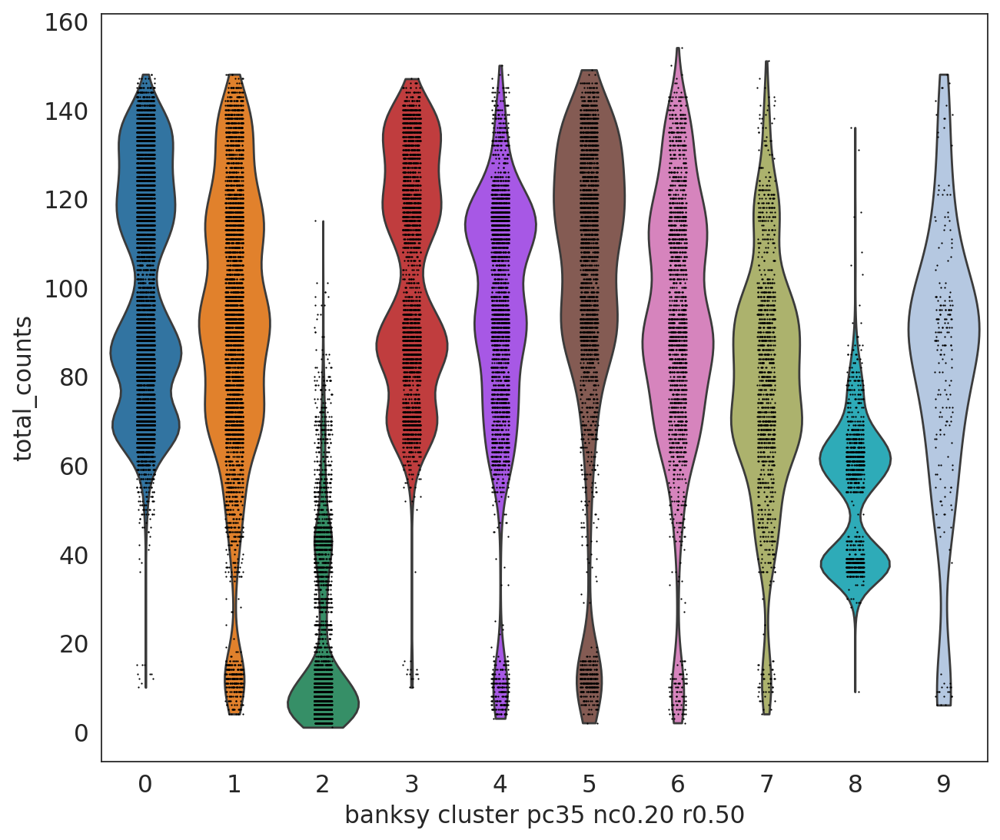

In [137]:
sc.pl.violin(
    adata_spatial, 
    "total_counts", 
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}", 
    save= f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
    )

In [138]:
adata_spatial.obs.keys()

Index(['nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword',
       'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area',
       'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'threshold_passed', 'labels_scaled_gaussian_pc35_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc35_nc0.20_r0.50',
       'banksy_cluster_pc35_nc0.20_r0.50_raw'],
      dtype='object')

In [139]:
adata_spatial.obs['threshold_passed_str'] = (adata.obs['threshold_passed']).astype(str)

In [140]:
adata_spatial.obs['threshold_passed_str']
adata_spatial.obs.keys()

Index(['nucleus_area', 'nCount_Xenium', 'nFeature_Xenium', 'segmentation_method', 'nCount_BlankCodeword', 'nFeature_BlankCodeword',
       'nCount_ControlCodeword', 'nFeature_ControlCodeword', 'nCount_ControlProbe', 'nFeature_ControlProbe', 'x', 'y', 'cell_area',
       'nCount_SCT', 'nFeature_SCT', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts',
       'pct_counts_in_top_10_genes', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt',
       'threshold_passed', 'labels_scaled_gaussian_pc35_nc0.20_r0.50', 'cell type', 'banksy_cluster_pc35_nc0.20_r0.50',
       'banksy_cluster_pc35_nc0.20_r0.50_raw', 'threshold_passed_str'],
      dtype='object')

#### Cluster level violin plot of cells that pass the minimum trancript count threshhold "threshold_passed_str"

In [141]:
#print(obs.__class__)
#obs


akljhmnp-1    1
akljiabi-1    7
aklkomhk-1    8
akllenhp-1    1
aklobaoh-1    2
             ..
ojdcldep-1    5
ojdcmfnn-1    5
ojdddlfk-1    2
ojddgmnh-1    2
ojddpahj-1    2
Name: cell type, Length: 30203, dtype: category
Categories (10, object): ['0', '1', '2', '3', ..., '6', '7', '8', '9']


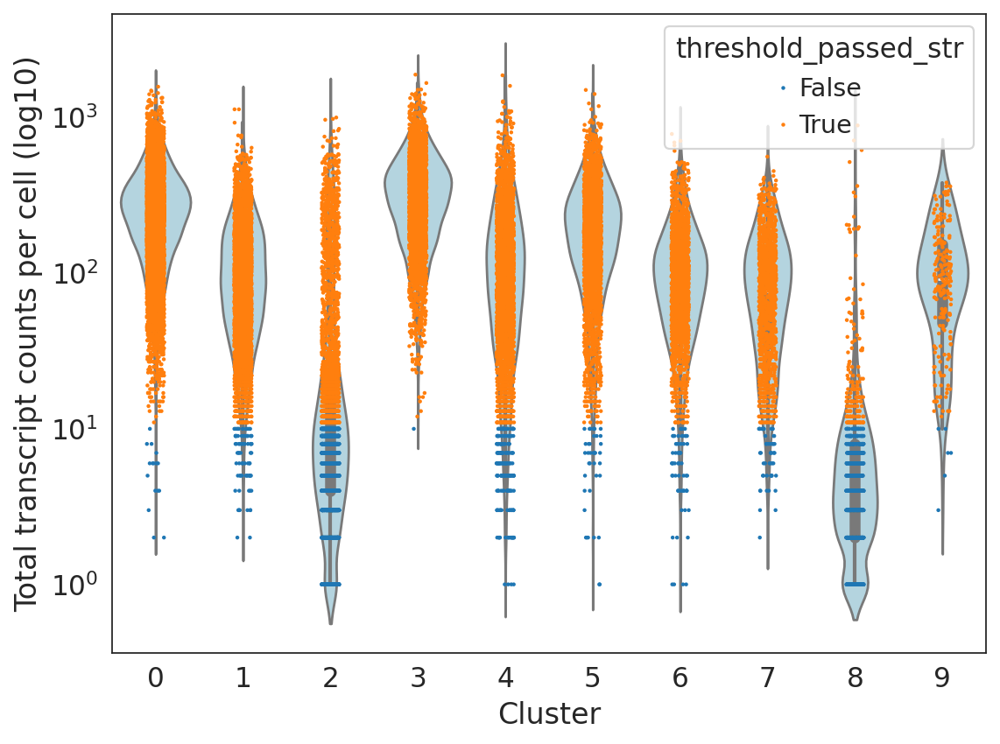

In [190]:
import pandas as ps

## convert adata.obs to a dataframe
obs = adata_spatial.obs
print(obs["cell type"])

import seaborn as sns


plt.figure(figsize=(8, 6))
sns.violinplot(data=obs, y=obs["nCount_Xenium"],  x=obs["cell type"], log_scale=10, color="lightblue")

sns.stripplot(data=obs, y=obs["nCount_Xenium"], x=obs["cell type"], hue =obs["threshold_passed_str"], size=2)

plt.xlabel("Cluster", fontsize=15)
plt.ylabel("Total transcript counts per cell (log10)", fontsize=15)

plt.savefig(
    os.path.join(qc_path, f"threshold_passed_cells_per_cluster_violin_plot_{dataset_name}.png"),
    dpi=300,
    bbox_inches='tight'
    )


In [143]:
sns.color_palette()

[(0.12156862745098039, 0.4666666666666667, 0.7058823529411765),
 (1.0, 0.4980392156862745, 0.054901960784313725),
 (0.15294117647058825, 0.6196078431372549, 0.40784313725490196),
 (0.8392156862745098, 0.15294117647058825, 0.1568627450980392),
 (0.6666666666666666, 0.25098039215686274, 0.9882352941176471),
 (0.5490196078431373, 0.33725490196078434, 0.29411764705882354),
 (0.8901960784313725, 0.4666666666666667, 0.7607843137254902),
 (0.7098039215686275, 0.7411764705882353, 0.3803921568627451),
 (0.09019607843137255, 0.7450980392156863, 0.8117647058823529),
 (0.6823529411764706, 0.7803921568627451, 0.9098039215686274),
 (1.0, 0.7333333333333333, 0.47058823529411764),
 (0.596078431372549, 0.8745098039215686, 0.5411764705882353),
 (1.0, 0.596078431372549, 0.5882352941176471),
 (0.7725490196078432, 0.6901960784313725, 0.8352941176470589),
 (0.7686274509803922, 0.611764705882353, 0.5803921568627451),
 (0.9686274509803922, 0.7137254901960784, 0.8235294117647058),
 (0.8588235294117647, 0.8588235294117647, 0.5529411764705883),
 (0.6196078431372549, 0.8549019607843137, 0.8980392156862745),
 (0.6784313725490196, 0.28627450980392155, 0.2901960784313726),
 (0.5490196078431373, 0.42745098039215684, 0.19215686274509805)]

         Falling back to preprocessing with `sc.pp.pca` and default params.


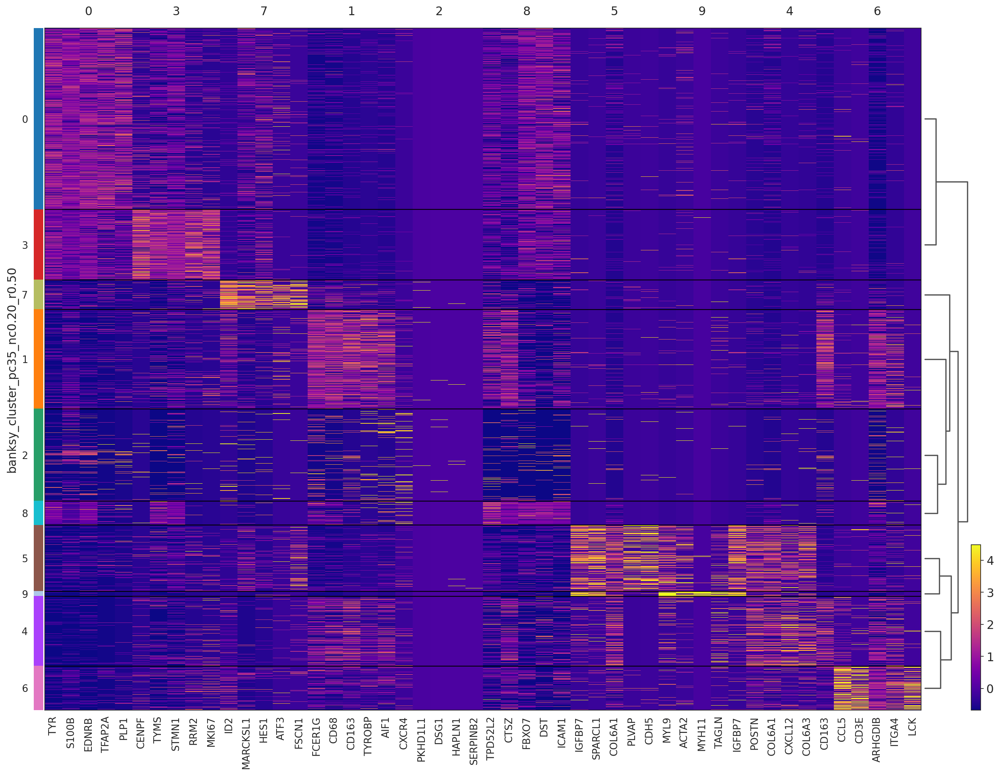

In [144]:
# Set the figure directory to your desired location
sc.settings.figdir = output_path

## Generate heat map for top markers per cluster
sc.tl.dendrogram(
    adata_spatial,
    groupby='banksy_cluster_pc35_nc0.20_r0.50_raw',
    key_added=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_raw'
)

## Determine vmin and vmax dynamically based on gene expression
expr_values = adata_spatial.X
vmax_dynamic = np.percentile(expr_values[expr_values > 0], 99)
vmin_dynamic = np.percentile(expr_values, 1)

sc.pl.rank_genes_groups_heatmap(
    adata_spatial, 
    key=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw',
    #key= 'raw_test',
    n_genes=5,
    cmap = "plasma",
    vmin=vmin_dynamic,
    vmax=vmax_dynamic,
    show_gene_labels = True,
    save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_raw_markers.png",
    figsize=(20, 15)
)

### Non-spatial clustering results

In [145]:
# banksy_dict['scaled_gaussian'][0.2]['adata'] #lambda = 0.2
adata_nonspatial.obs['banksy_cluster_nonspatial']= adata_nonspatial.obs[f"labels_nonspatial_pc{pca_label}_nc0.00_r{res_label}"].astype(str)

In [146]:
# ## Rank the genes for the non-spatial data

# sc.tl.rank_genes_groups(
#     adata_nonspatial,
#     groupby='banksy_cluster_nonspatial',
#     method='wilcoxon',
#     key_added='banksy_markers_nonspatial'
# )

In [147]:
# ## Plot the top 20 marker genes per cluster

# sc.pl.rank_genes_groups(
#     adata_nonspatial, 
#     key='banksy_markers_nonspatial', 
#     n_genes=20, 
#     fontsize=15,
#     save= f"_{dataset_name}_pc{pca_label}_r{res_label}_top_gene.png")

In [148]:
# sc.tl.dendrogram(
#     adata_spatial,
#     groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"
# )

# sc.pl.rank_genes_groups_heatmap(
#     adata_nonspatial, 
#     key='banksy_markers_nonspatial', 
#     n_genes=5,
#     cmap = "plasma",
#     #vmin=0,
#     #vmax=2,
#     show_gene_labels = True,
#     save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
    


### Export the top 20 clusters in wide format to .csv

In [149]:
from banksy_utils.annotation_utils import export_clusters_wide

key= f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_markers_raw"

export_clusters_wide(
    adata= adata_spatial,
    key= key,
    gene_type= "raw",
    top_n= 20,
    dataset_name= dataset_name,
    file_path= processed_path
)

          0        1         2         3         4        5        6         7        8        9
0       TYR   FCER1G     CXCR4     CENPF     POSTN   IGFBP7     CCL5       ID2  TPD52L2     MYL9
1     S100B     CD68   PKHD1L1      TYMS    COL6A1  SPARCL1     CD3E  MARCKSL1     CTSZ    ACTA2
2     EDNRB    CD163      DSG1     STMN1    CXCL12   COL6A1  ARHGDIB      HES1    FBXO7    MYH11
3    TFAP2A   TYROBP    HAPLN1      RRM2    COL6A3    PLVAP    ITGA4      ATF3      DST    TAGLN
4      PLP1     AIF1  SERPINB2     MKI67     CD163     CDH5      LCK     FSCN1    ICAM1   IGFBP7
5      MITF  ARHGDIB       HBD     TOP2A       LYZ     THY1     CD3G       ID1    ITGB1  SPARCL1
6     MLANA   RNASE1      AREG     HMGN2   ARHGDIB    POSTN     CD3D    TUBB2B    LENG8   NOTCH3
7     PRAME     CTSZ      FUT6     PTTG1       CD4     AQP1     CD8A       MYC    COTL1   IGFBP5
8      QPCT    COTL1     CLDN4     HMGB2    COL5A2    ITGB1     CCL4     VEGFA    STMN1    CALD1
9      PMEL      CD4      DSG3

### Export the top 20 clusters in long format with scores to .csv

In [150]:
from banksy_utils.annotation_utils import export_cluster_markers

cluster_markers = export_cluster_markers(
    adata = adata_spatial,
    key = key,
    top_n = 30,
    dataset_name = dataset_name,
    file_path = processed_path
)
print(cluster_markers)

     cluster    gene      score
0          0     TYR  91.756897
1          0   S100B  88.011314
2          0   EDNRB  86.977081
3          0  TFAP2A  82.413986
4          0    PLP1  79.725021
..       ...     ...        ...
205        9   ITGB1  10.121699
206        9    SOD3   9.216952
207        9   POSTN   8.503986
208        9    THY1   8.082708
209        9   INHBA   7.667495

[210 rows x 3 columns]


### Add cell_type information to top clusters for manual annotation

In [151]:
## Read in the exported cluster markers generated with "export_clusters_wide()"
## and merge with the cell type annotation master document
n_genes_label =  20 # Set this to the number of genes that were exorted as top markers for each cluster
#top_markers = pd.read_csv(f"{processed_path}cluster_top_{n_genes_label}_genes_with_scores_{dataset_name}_{key}.csv", index_col=0) #index_col = 0 prevents insertion of an unnamed col
#top_markers = top_markers.sort_index()
top_markers = cluster_markers.sort_index()
#print(top_markers)

## Read in the master annotation file which contains all the curated cell type labels for each marker gene
master_markers_file = pd.read_csv(f"{raw_data}xenium_gene_list_annotation_master.csv")

## Create a data frame of the genes and their corresponding primary and secondary cell type annotations 
cell_annotations = master_markers_file[["Gene", "primary_annotation", "secondary_annotation"]]
#cell_annotations = cell_annotations.sort_index()

## Merge the top marker results and the cell type annotations
merged_markers = (
    pd.merge(
        top_markers.reset_index(), 
        cell_annotations, 
        left_on="gene", 
        right_on="Gene", 
        how="left", 
        sort="False",
        validate="m:1"
    )
    .set_index("index")
    .loc[top_markers.index]
)

merged_markers = merged_markers.drop("Gene", axis=1)
print(merged_markers)

## Export the cell type annotated top markers to .csv to use in manual annotation and ChatGPT annotation
merged_markers.to_csv(f"{processed_path}cell_type_cluster_top_{n_genes_label}_genes_{dataset_name}_{key}.csv")

     cluster    gene      score                    primary_annotation                   secondary_annotation
0          0     TYR  91.756897                 Melanocytes; Melanoma                                    NaN
1          0   S100B  88.011314  DC_AXL_SIGLEC6; Macrophages and DC_2                                    NaN
2          0   EDNRB  86.977081                              Melanoma  neural_crest_cell_derived_melanocytes
3          0  TFAP2A  82.413986                             TSK_basal                      neural_crest_cell
4          0    PLP1  79.725021                              Melanoma                        neuronal_myelin
..       ...     ...        ...                                   ...                                    ...
205        9   ITGB1  10.121699          EpSC and Other Progenitors_1                                    NaN
206        9    SOD3   9.216952       Secretory-papillary Fibroblasts              oxidative_stress_response
207        9   POST

## Relabel cluster with cell type annotation

In [152]:
## The top 20 gene markers for each cluster are assessed for cell cluster annotation

new_labels = {
    '0' : 'Invasive_Neural_crest-like_melanoma_0',
    '1' : 'M2-like_Tumour_Associated_Macrophages_1',
    '2' : 'Inflamed_Bronchial_Epithelial_Cells_(low_confidence)_2',
    '3' : 'Cycling_melanoma_cells_3',
    '4' : 'Cancer_Associated_Fibroblasts_4',
    '5' : 'Vascular_Endothelial_Cells_5', 
    '6' : 'Cytotoxic_CD8+_and_CD4+_T_Cells_6',
    '7' : 'Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7',
    '8' : 'Mesenchymal-like_Melanoma_Cells_8',
    '9' : 'Vascular_smooth_muscle_or_pericytes_9'
}

cluster_col = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}"
adata_spatial.obs[f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"] = adata_spatial.obs[cluster_col].map(new_labels)

new_labels

{'0': 'Invasive_Neural_crest-like_melanoma_0',
 '1': 'M2-like_Tumour_Associated_Macrophages_1',
 '2': 'Inflamed_Bronchial_Epithelial_Cells_(low_confidence)_2',
 '3': 'Cycling_melanoma_cells_3',
 '4': 'Cancer_Associated_Fibroblasts_4',
 '5': 'Vascular_Endothelial_Cells_5',
 '6': 'Cytotoxic_CD8+_and_CD4+_T_Cells_6',
 '7': 'Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7',
 '8': 'Mesenchymal-like_Melanoma_Cells_8',
 '9': 'Vascular_smooth_muscle_or_pericytes_9'}

In [153]:
adata_spatial.obs

,nucleus_area,nCount_Xenium,nFeature_Xenium,segmentation_method,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,...,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,threshold_passed,labels_scaled_gaussian_pc35_nc0.20_r0.50,cell type,banksy_cluster_pc35_nc0.20_r0.50,banksy_cluster_pc35_nc0.20_r0.50_raw,threshold_passed_str,banksy_cluster_pc35_nc0.20_r0.50_ann
akljhmnp-1,16.346563,134.0,43,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,True,1,1,1,1,True,M2-like_Tumour_Associated_Macrophages_1
akljiabi-1,40.550314,103.0,39,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,True,7,7,7,7,True,Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7
aklkomhk-1,NaN,1.0,1,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,8,8,8,8,False,Mesenchymal-like_Melanoma_Cells_8
akllenhp-1,NaN,8.0,6,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,1,1,1,1,False,M2-like_Tumour_Associated_Macrophages_1
aklobaoh-1,NaN,3.0,3,Segmented by boundary stain (ATP1A1+CD45+E-Cad...,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,2,2,2,2,False,Inflamed_Bronchial_Epithelial_Cells_(low_confi...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ojdcldep-1,15.353126,43.0,25,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,True,5,5,5,5,True,Vascular_Endothelial_Cells_5
ojdcmfnn-1,18.694688,7.0,5,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,5,5,5,5,False,Vascular_Endothelial_Cells_5
ojdddlfk-1,10.837500,9.0,9,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,2,2,2,2,False,Inflamed_Bronchial_Epithelial_Cells_(low_confi...
ojddgmnh-1,31.157814,10.0,10,Segmented by nucleus expansion of 5.0µm,0.0,0,0.0,0,0.0,0,...,0.0,0.0,0.0,False,2,2,2,2,False,Inflamed_Bronchial_Epithelial_Cells_(low_confi...


([0, 1, 2, 3, 4, 5, 6, 7, 8, 9],
 [Text(0, 0, 'Invasive_Neural_crest-like_melanoma_0'),
  Text(1, 0, 'M2-like_Tumour_Associated_Macrophages_1'),
  Text(2, 0, 'Inflamed_Bronchial_Epithelial_Cells_(low_confidence)_2'),
  Text(3, 0, 'Cycling_melanoma_cells_3'),
  Text(4, 0, 'Cancer_Associated_Fibroblasts_4'),
  Text(5, 0, 'Vascular_Endothelial_Cells_5'),
  Text(6, 0, 'Cytotoxic_CD8+_and_CD4+_T_Cells_6'),
  Text(7, 0, 'Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7'),
  Text(8, 0, 'Mesenchymal-like_Melanoma_Cells_8'),
  Text(9, 0, 'Vascular_smooth_muscle_or_pericytes_9')])

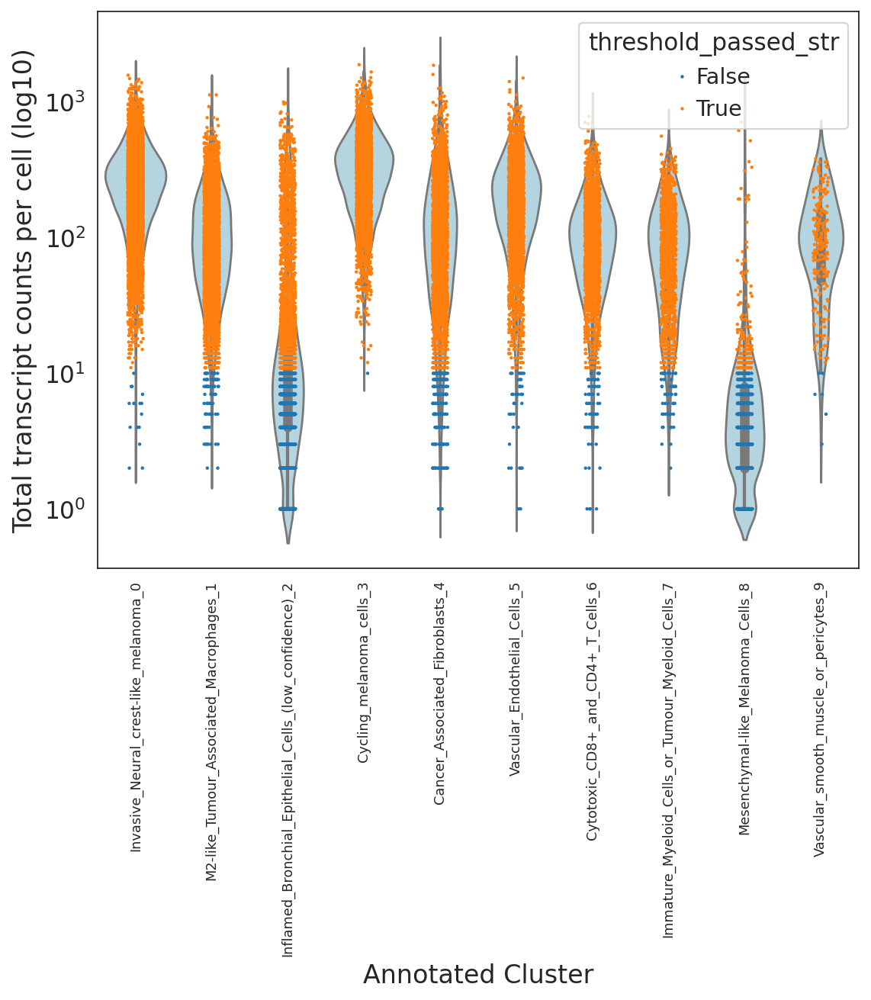

In [195]:
import pandas as ps

## convert adata.obs to a dataframe
obs = adata_spatial.obs
#print(obs["cell type"])

import seaborn as sns


plt.figure(figsize=(8, 6))
sns.violinplot(data=obs, y=obs["nCount_Xenium"],  x=obs["banksy_cluster_pc35_nc0.20_r0.50_ann"], log_scale=10, color="lightblue")
sns.stripplot(data=obs, y=obs["nCount_Xenium"], x=obs["banksy_cluster_pc35_nc0.20_r0.50_ann"], hue =obs["threshold_passed_str"], size=2)

plt.xlabel("Annotated Cluster", fontsize=15)
plt.ylabel("Total transcript counts per cell (log10)", fontsize=15)

plt.xticks(rotation=90, fontsize=8)



In [155]:
## Store the UMAP results in the .obsm slot
adata_spatial.obsm['X_umap'] = banksy_dict['scaled_gaussian'][0.2]['adata'].obsm[f"reduced_pc_{pca_label}_umap"]

## Visualisations

### Cluster Annotated UMAP

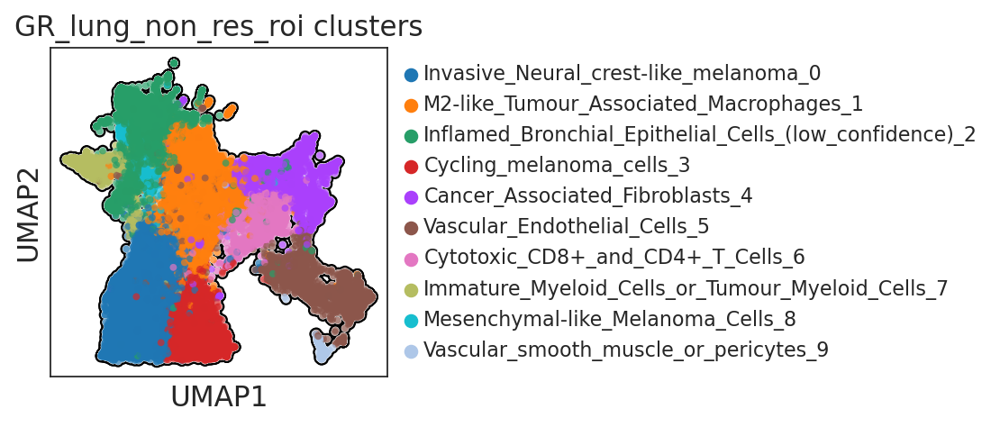

In [176]:
# Plot the umap with bulk labels
import scanpy as sc
from matplotlib.pyplot import rc_context

color_vars = [
f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
]

with rc_context({"figure.figsize": (3,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=50, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=10,
        title=f"{dataset_name} clusters",
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
        )

#### Cluster annotated UMAP with threshold_passed cells overlay

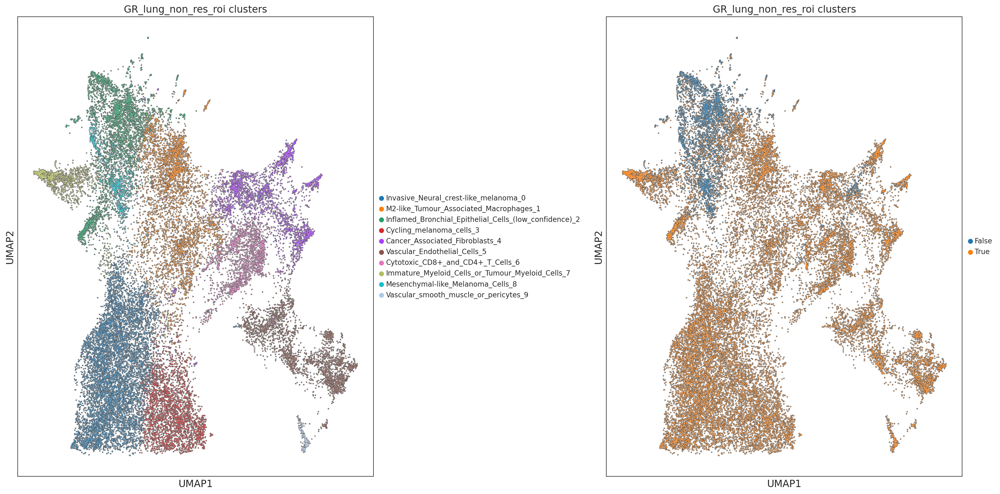

In [ ]:
# Plot the umap with bulk labels

color_vars = [
f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
]

fig, axes = plt.subplots(1, 2, figsize=(20,10))

#with rc_context({"figure.figsize": (3,3)}):
sc.pl.umap(
    adata_spatial, 
    color=color_vars, 
    s=5, 
    frameon=True, 
    vmax="p99",
    add_outline=True,
    legend_fontsize=10,
    title=f"{dataset_name} clusters",
    ax=axes[0],
    show=False
    #save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png",
    )

color_vars = [
"threshold_passed_str"
]

#with rc_context({"figure.figsize": (3,3)}):
sc.pl.umap(
    adata_spatial, 
    color=color_vars, 
    s=5, 
    frameon=True, 
    vmax="p99",
    add_outline=True,
    legend_fontsize=10,
    title=f"{dataset_name} clusters",
    ax=axes[1],
    show=False
    #save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png",
    )

plt.tight_layout()
plt.savefig(os.path.join(qc_path, f"umap_{dataset_name}_threshold.png"), dpi=300, bbox_inches='tight')
plt.show()

### Gene of interest UMAP plotting

In [ ]:
color_vars = [
"TPD52", "TPD52L1", "TPD52L2"
]

with rc_context({"figure.figsize": (5,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["TPD52 expression in lung non-responder", "TPD52L1 expression in lung non-responder", "TPD52L2 expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD52-like_genes.png"
        )

In [ ]:
color_vars = [
"DSG2", "ID1", "VEGFA"
]

with rc_context({"figure.figsize": (6,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["DSG2 expression in lung non-responder", "ID1 expression in lung non-responder", "VEGFA expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_ID1_VEGFA.png"
        )

In [ ]:
color_vars = [
"ID1", "ID2"
]

with rc_context({"figure.figsize": (5,3)}):
    sc.pl.umap(
        adata_spatial, 
        color=color_vars, 
        s=20, 
        frameon=True, 
        vmax="p99",
        add_outline=True,
        legend_fontsize=9,
        title=["ID1 expression in lung non-responder", "ID2 expression in lung non-responder"],
        save = f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_ID1_ID2.png"
        )

### Gene expression Dotplot

In [ ]:
# new_labels = {
#     '0' : 'Invasive_Neural_crest-like_melanoma_0',
#     '1' : 'M2-like_Tumour_Associated_Macrophages_1',
#     '2' : 'Inflamed_Bronchial_Epithelial_Cells_(low_confidence)_2',
#     '3' : 'Cycling_melanoma_cells_3',
#     '4' : 'Cancer_Associated_Fibroblasts_4',
#     '5' : 'Vascular_Endothelial_Cells_5', 
#     '6' : 'Cytotoxic_CD8+_and_CD4+_T_Cells_6',
#     '7' : 'Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7',
#     '8' : 'Mesenchymal-like_Melanoma_Cells_8',
#     '9' : 'Vascular_smooth_muscle_or_pericytes_9'
# }

In [ ]:
from banksy_utils.annotation_utils import extract_marker_genes_dict

subset_cluster= ["Cytotoxic_CD8+_and_CD4+_T_Cells_6", "Immature_Myeloid_Cells_or_Tumour_Myeloid_Cells_7"]

marker_genes_dict=extract_marker_genes_dict(
    adata=adata_spatial, 
    filtered_key=key_filtered, 
    gene_type='raw', 
    groupby = f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    subset_cluster= subset_cluster,
    top_n=20
    )
marker_genes_dict

# Create a list of genes for this small dictionary so that the dendogram can be sorted by similarity
#marker_genes_list = marker_genes_dict["Tumour Myeloid Cells_7"]

In [ ]:
# all_genes_test = sum(marker_genes_dict.values(), [])
# print(all_genes_test)

In [ ]:
## Ensure that the patch line edge colopur is set to black in global matplotlib rcparams so that the bracket to group genes per cluster is shown
plt.rcParams['patch.edgecolor'] = 'black'

## Compute the dendrogram for clusters
sc.tl.dendrogram(
    adata_spatial,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann"
    )

## Generate dot plot
sc.pl.dotplot(
    adata_spatial,
    #marker_genes_list,
    marker_genes_dict,
    groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    dendrogram=True,
    save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_dot_plot.png"
    )

In [ ]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, ["FUT6", "FUT7"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_FUT6_FUT7_violin_plot.png"
        )


In [ ]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, 
        ["TPD52", "TPD52L1", "TPD52L2"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_TPD54_family_violin_plot.png"
        )

In [ ]:
with rc_context({"figure.figsize": (4.5, 3)}):
    sc.pl.violin(
        adata_spatial, 
        ["DSG2"], 
        groupby=f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}",
        save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_DSG2_violin_plot.png"
        )

In [ ]:
sc.pl.dendrogram(
    adata_spatial,
    groupby=f'banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann',
    save=f"_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.png"
)

sc.pl.correlation_matrix(
    adata_spatial,
    #groupby='banksy_cluster_pc35_nc0.20_r0.50_raw',
    f"banksy_cluster_pc{pca_label}_nc{lambda_label}_r{res_label}_ann",
    save=f"{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_cluster_correlation_plot.png",
    figsize=(5, 3.5)
)

## Export the banksy dictionary, the adata objects and the results_df


In [ ]:
# Save AnnData objects with clustering results

adata_spatial.write_h5ad(
    filename = f"{output_path}{dataset_name}_clustered_spatial_pc{pca_label}_nc{lambda_label}_r{res_label}.h5ad",
    compression="gzip"
    )

adata_nonspatial.write_h5ad(
    filename = f"{output_path}{dataset_name}_clustered_nonspatial_pc{pca_label}_r{res_label}.h5ad"
)

In [ ]:
## Export the banksy_dict dictionary as a .pkl file
## Use gzip to save it with compression
import gzip
import pickle
with gzip.open(f"{output_path}{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}_banksy_dict.pkl.gz", "wb") as f:
    pickle.dump(banksy_dict, f)


## Export the results_df data frame as a .pkl file
with gzip.open(f"{output_path}results_df_{dataset_name}_pc{pca_label}_nc{lambda_label}_r{res_label}.pkl.gz", "wb") as f:
    pickle.dump(results_df, f)